In [ ]:
Classifications works best on untransformed data

In [27]:
import time

# Get the current time in seconds since the epoch
current_time_seconds = time.time()

# Convert the seconds into a structured time (local time)
local_time = time.localtime(current_time_seconds)

# Convert the structured time to a human-readable format
human_readable_time = time.strftime("%Y-%m-%d %H:%M:%S", local_time)

print(f"Current Time: {human_readable_time}")

Current Time: 2024-11-17 14:54:16


In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df1=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/Telco_customer_churn.xlsx")
df2=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/Telco_customer_churn_location.xlsx")
df3=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/CustomerChurn.xlsx")
df4=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/Telco_customer_churn_demographics.xlsx")
df5=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/Telco_customer_churn_status.xlsx")
df6=pd.read_excel(r"/Users/Tushar/Downloads/Telecommunications_Industry/Telco_customer_churn_services.xlsx")

In [4]:
continuous_df = pd.concat([df6[['Tenure in Months', 'Avg Monthly Long Distance Charges', 'Monthly Charge','Total Extra Data Charges',
                'Total Charges', 'Total Refunds','Total Long Distance Charges', 'Total Revenue']],df4[['Age']],df5[['CLTV','Churn Score']],df1[['Churn Value']]],axis=1)

# Creating a DataFrame for categorical variables by concatenating columns from multiple DataFrames
categorical_df = pd.concat([df6[['Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 
                              'Internet Type', 'Online Security', 'Online Backup', 'Device Protection Plan', 
                              'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 
                              'Contract', 'Paperless Billing', 'Payment Method']],
                         df5[['Satisfaction Score','Churn Reason']],
                         df4[['Gender','Senior Citizen','Married','Dependents']],
                          df3[['Tech Support','Partner']],
                         df2[['City','Zip Code']],df1[['Churn Value']],df2[['State', 'Country']]],axis=1)

In [5]:
categorical_df['Churn Reason'] = categorical_df['Churn Reason'].fillna("No Churn")
categorical_df.info()
categorical_df = categorical_df.drop(columns=['Churn Reason'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Offer                   7043 non-null   object
 1   Phone Service           7043 non-null   object
 2   Multiple Lines          7043 non-null   object
 3   Internet Service        7043 non-null   object
 4   Internet Type           7043 non-null   object
 5   Online Security         7043 non-null   object
 6   Online Backup           7043 non-null   object
 7   Device Protection Plan  7043 non-null   object
 8   Streaming TV            7043 non-null   object
 9   Streaming Movies        7043 non-null   object
 10  Streaming Music         7043 non-null   object
 11  Unlimited Data          7043 non-null   object
 12  Contract                7043 non-null   object
 13  Paperless Billing       7043 non-null   object
 14  Payment Method          7043 non-null   object
 15  Sati

# Categorical data encoding

In [7]:
import pandas as pd

# Define columns based on unique values for encoding
binary_and_low_cardinality_columns = [
    'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 
    'Device Protection Plan', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 
    'Paperless Billing', 'Senior Citizen', 'Married', 'Dependents', 'Partner', 'Gender', 
     'Offer', 'Internet Type', 'Contract', 'Payment Method', 
    'Satisfaction Score', 'Tech Support'
]

high_cardinality_columns = [ 'City', 'Zip Code']

# Apply One-Hot Encoding for binary and low-cardinality columns in a single step
categorical_encoded_df = pd.get_dummies(categorical_df, columns=binary_and_low_cardinality_columns, drop_first=True)

# Apply Frequency Encoding for high-cardinality columns
for col in high_cardinality_columns:
    freq_encoding = categorical_encoded_df[col].value_counts().to_dict()
    categorical_encoded_df[col] = categorical_encoded_df[col].map(freq_encoding)

# Drop columns with only one unique value as they don't add any predictive information
categorical_encoded_df = categorical_encoded_df.drop(columns=['State', 'Country'])

# Display the transformed DataFrame
print("Transformed DataFrame with Encoded Columns:")
print(categorical_encoded_df.head())

Transformed DataFrame with Encoded Columns:
   City  Zip Code  Churn Value  Phone Service_Yes  Multiple Lines_Yes  \
0   293         5            1                  0                   0   
1   293         5            1                  1                   1   
2   293         5            1                  1                   1   
3    25         5            1                  1                   0   
4    30         5            1                  1                   1   

   Internet Service_Yes  Online Security_Yes  Online Backup_Yes  \
0                     1                    0                  0   
1                     1                    0                  1   
2                     1                    0                  0   
3                     1                    0                  1   
4                     1                    0                  0   

   Device Protection Plan_Yes  Streaming TV_Yes  ...  Contract_One Year  \
0                           1          

In [8]:
total_df=pd.concat([continuous_df,categorical_encoded_df],axis=1)

In [34]:
total_df['Churn Value'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Churn Value  7043 non-null   int64
 1   Churn Value  7043 non-null   int64
dtypes: int64(2)
memory usage: 110.2 KB


In [15]:
total_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 50 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Tenure in Months                   7043 non-null   int64  
 1   Avg Monthly Long Distance Charges  7043 non-null   float64
 2   Monthly Charge                     7043 non-null   float64
 3   Total Extra Data Charges           7043 non-null   int64  
 4   Total Charges                      7043 non-null   float64
 5   Total Refunds                      7043 non-null   float64
 6   Total Long Distance Charges        7043 non-null   float64
 7   Total Revenue                      7043 non-null   float64
 8   Age                                7043 non-null   int64  
 9   CLTV                               7043 non-null   int64  
 10  Churn Score                        7043 non-null   int64  
 11  Churn Value                        7043 non-null   int64

# Remove multiple target columns i.e. Churn Value

In [9]:
# Identify all columns named 'Churn Value'
churn_columns = [col for col in total_df.columns if col == 'Churn Value']

# Drop all duplicate 'Churn Value' columns except the first one
if len(churn_columns) > 1:
    total_df = total_df.loc[:, ~total_df.columns.duplicated(keep='first')]

print("Updated DataFrame columns:")
print(total_df.info())

Updated DataFrame columns:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 48 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Tenure in Months                   7043 non-null   int64  
 1   Avg Monthly Long Distance Charges  7043 non-null   float64
 2   Monthly Charge                     7043 non-null   float64
 3   Total Extra Data Charges           7043 non-null   int64  
 4   Total Charges                      7043 non-null   float64
 5   Total Refunds                      7043 non-null   float64
 6   Total Long Distance Charges        7043 non-null   float64
 7   Total Revenue                      7043 non-null   float64
 8   Age                                7043 non-null   int64  
 9   CLTV                               7043 non-null   int64  
 10  Churn Score                        7043 non-null   int64  
 11  Churn Value                  

# Backward elimination for feature selection

In [10]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Separate features (X) and target (y)
X = total_df.drop('Churn Value', axis=1)  # Features
y = total_df['Churn Value']  # Target

# Initialize variables
remaining_features = list(X.columns)
best_score = 0
eliminated_features = []

# Start backward elimination process
while len(remaining_features) > 0:
    scores = {}
    
    # Train and evaluate by removing one feature at a time
    for feature in remaining_features:
        temp_features = [f for f in remaining_features if f != feature]
        dt = DecisionTreeClassifier(random_state=42)
        dt.fit(X[temp_features], y)
        y_pred = dt.predict(X[temp_features])
        score = accuracy_score(y, y_pred)
        scores[feature] = score
    
    # Find the feature whose removal has the least impact on performance
    worst_feature = min(scores, key=scores.get)
    
    # If removing this feature improves the model, remove it
    if scores[worst_feature] > best_score:
        best_score = scores[worst_feature]
        eliminated_features.append(worst_feature)
        remaining_features.remove(worst_feature)
    else:
        # Stop if no further improvement
        break

# Output the selected and eliminated features
print("Selected Features after Backward Elimination:", remaining_features)
print("Eliminated Features:", eliminated_features)

Selected Features after Backward Elimination: ['Avg Monthly Long Distance Charges', 'Monthly Charge', 'Total Extra Data Charges', 'Total Charges', 'Total Refunds', 'Total Long Distance Charges', 'Total Revenue', 'Age', 'CLTV', 'Churn Score', 'City', 'Zip Code', 'Phone Service_Yes', 'Multiple Lines_Yes', 'Internet Service_Yes', 'Online Security_Yes', 'Online Backup_Yes', 'Device Protection Plan_Yes', 'Streaming TV_Yes', 'Streaming Movies_Yes', 'Streaming Music_Yes', 'Unlimited Data_Yes', 'Paperless Billing_Yes', 'Senior Citizen_Yes', 'Married_Yes', 'Dependents_Yes', 'Partner_Yes', 'Gender_Male', 'Offer_Offer A', 'Offer_Offer B', 'Offer_Offer C', 'Offer_Offer D', 'Offer_Offer E', 'Internet Type_DSL', 'Internet Type_Fiber Optic', 'Internet Type_None', 'Contract_One Year', 'Contract_Two Year', 'Payment Method_Credit Card', 'Payment Method_Mailed Check', 'Satisfaction Score_2', 'Satisfaction Score_3', 'Satisfaction Score_4', 'Satisfaction Score_5', 'Tech Support_No internet service', 'Tech 

In [29]:
len(remaining_features)


47

# Using gini , decision tree based on backward elimination output

Test Accuracy: 0.8965
Confusion Matrix (Test Data):
[[1177   93]
 [  82  339]]
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1270
           1       0.78      0.81      0.79       421

    accuracy                           0.90      1691
   macro avg       0.86      0.87      0.86      1691
weighted avg       0.90      0.90      0.90      1691


Validation Accuracy: 0.8864
Confusion Matrix (Validation Data):
[[931  78]
 [ 82 318]]
Classification Report (Validation Data):
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1009
           1       0.80      0.80      0.80       400

    accuracy                           0.89      1409
   macro avg       0.86      0.86      0.86      1409
weighted avg       0.89      0.89      0.89      1409



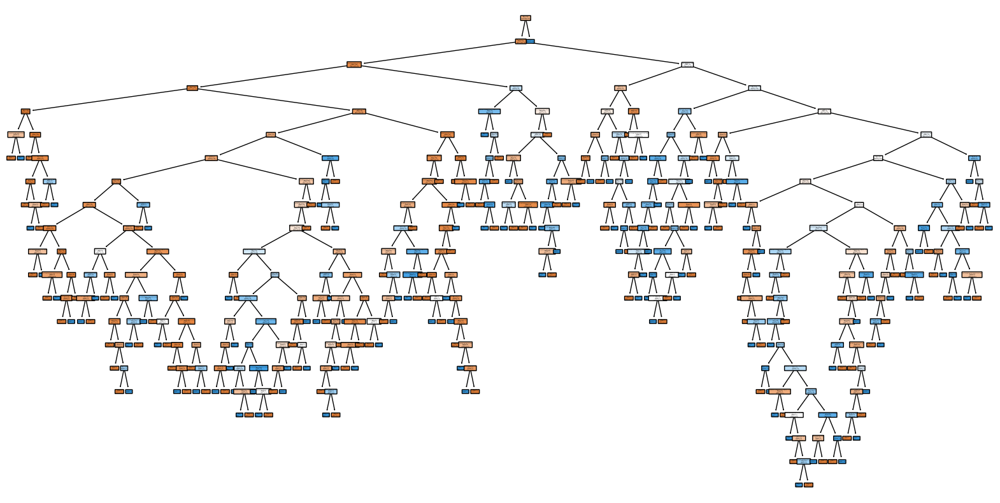


Feature Importance (based on Gini Impurity):
Age                                  0.551222
Churn Score                          0.123395
Satisfaction Score_2                 0.032345
Monthly Charge                       0.030954
Avg Monthly Long Distance Charges    0.030048
City                                 0.022922
Zip Code                             0.020450
CLTV                                 0.020215
Tenure in Months                     0.019340
Total Long Distance Charges          0.019001
Total Revenue                        0.017845
Total Charges                        0.015162
Satisfaction Score_5                 0.013921
Tech Support_No internet service     0.005667
Satisfaction Score_3                 0.005559
Satisfaction Score_4                 0.005375
Internet Type_Fiber Optic            0.005236
Married_Yes                          0.005138
Offer_Offer E                        0.004747
Unlimited Data_Yes                   0.004742
Total Extra Data Charges          

In [12]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Step 1: Load your dataset (assuming total_df is already available)
remaining_features = total_df.drop(columns=['Churn Value'])  # Features (excluding the target column)
target = total_df['Churn Value']  # Target column (Churn Value)

# Step 2: Split the data into Train + Test (80%) and Validation (20%)
X_train_test, X_validate, y_train_test, y_validate = train_test_split(remaining_features, target, test_size=0.2, random_state=42)

# Step 3: Split the Train+Test data into Train (70%) and Test (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_test, y_train_test, test_size=0.3, random_state=42)

# Step 4: Preprocessing continuous features (Scaling)
# If you have continuous variables, it's generally a good idea to scale them
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform training data
X_test_scaled = scaler.transform(X_test)  # Only transform test data
X_validate_scaled = scaler.transform(X_validate)  # Only transform validation data

# Step 5: Train a Decision Tree Classifier with Gini Impurity
dt = DecisionTreeClassifier(criterion='gini', random_state=42)
dt.fit(X_train_scaled, y_train)

# Step 6: Evaluate the model on Test data
# Predictions on the test set
y_pred_test = dt.predict(X_test_scaled)

# Step 7: Calculate performance metrics on Test data
# Accuracy on Test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test Accuracy: {accuracy_test:.4f}")

# Confusion Matrix on Test set
conf_matrix_test = confusion_matrix(y_test, y_pred_test)
print("Confusion Matrix (Test Data):")
print(conf_matrix_test)

# Classification Report on Test set
class_report_test = classification_report(y_test, y_pred_test)
print("Classification Report (Test Data):")
print(class_report_test)

# Step 8: Evaluate the model on Validation data
# Predictions on the validation set
y_pred_validate = dt.predict(X_validate_scaled)

# Step 9: Calculate performance metrics on Validation data
# Accuracy on Validation set
accuracy_validate = accuracy_score(y_validate, y_pred_validate)
print(f"\nValidation Accuracy: {accuracy_validate:.4f}")

# Confusion Matrix on Validation set
conf_matrix_validate = confusion_matrix(y_validate, y_pred_validate)
print("Confusion Matrix (Validation Data):")
print(conf_matrix_validate)

# Classification Report on Validation set
class_report_validate = classification_report(y_validate, y_pred_validate)
print("Classification Report (Validation Data):")
print(class_report_validate)

# Step 10: Visualize the Decision Tree
plt.figure(figsize=(20, 10))  # Adjust the size of the tree plot
plot_tree(dt, filled=True, feature_names=X_train.columns, class_names=['Not Churn', 'Churn'], rounded=True)
plt.show()

# Step 11: Feature Importance (to understand which features are important for predicting Churn)
feature_importance = pd.Series(dt.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nFeature Importance (based on Gini Impurity):")
print(feature_importance)

# Hyperparameter tuning on validation

In [13]:
from sklearn.model_selection import GridSearchCV

# Step 1: Define the parameter grid for tuning the Decision Tree
param_grid = {
    'criterion': ['gini', 'entropy'],  # Criterion for splitting the tree
    'max_depth': [3, 5, 10, None],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 5],  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None]  # The number of features to consider when looking for the best split
}

# Step 2: Set up GridSearchCV with DecisionTreeClassifier
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                           param_grid=param_grid,
                           scoring='accuracy',  # You can change this to another metric if needed
                           cv=5,  # 5-fold cross-validation
                           n_jobs=-1,  # Use all available CPUs
                           verbose=1)

# Step 3: Fit GridSearchCV on the scaled training data
grid_search.fit(X_train_scaled, y_train)

# Step 4: Print the best parameters found by GridSearchCV
print("Best Hyperparameters from GridSearchCV:")
print(grid_search.best_params_)

# Step 5: Use the best model to make predictions on the validation data
best_dt = grid_search.best_estimator_
y_pred_validate_tuned = best_dt.predict(X_validate_scaled)

# Step 6: Evaluate the performance on Validation data after tuning
accuracy_validate_tuned = accuracy_score(y_validate, y_pred_validate_tuned)
print(f"\nValidation Accuracy after Hyperparameter Tuning: {accuracy_validate_tuned:.4f}")

conf_matrix_validate_tuned = confusion_matrix(y_validate, y_pred_validate_tuned)
print("Confusion Matrix (Validation Data after Tuning):")
print(conf_matrix_validate_tuned)

class_report_validate_tuned = classification_report(y_validate, y_pred_validate_tuned)
print("Classification Report (Validation Data after Tuning):")
print(class_report_validate_tuned)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best Hyperparameters from GridSearchCV:
{'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2}

Validation Accuracy after Hyperparameter Tuning: 0.8985
Confusion Matrix (Validation Data after Tuning):
[[950  59]
 [ 84 316]]
Classification Report (Validation Data after Tuning):
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      1009
           1       0.84      0.79      0.82       400

    accuracy                           0.90      1409
   macro avg       0.88      0.87      0.87      1409
weighted avg       0.90      0.90      0.90      1409



# Test accuracy after hyper tuning

In [14]:
best_dt = grid_search.best_estimator_

# Step 2: Make predictions on the test data
y_pred_test_tuned = best_dt.predict(X_test_scaled)

# Step 3: Calculate test accuracy
accuracy_test_tuned = accuracy_score(y_test, y_pred_test_tuned)
print(f"\nTest Accuracy after Hyperparameter Tuning: {accuracy_test_tuned:.4f}")

# Optional: Confusion Matrix and Classification Report for Test Data
conf_matrix_test_tuned = confusion_matrix(y_test, y_pred_test_tuned)
print("\nConfusion Matrix (Test Data after Tuning):")
print(conf_matrix_test_tuned)

class_report_test_tuned = classification_report(y_test, y_pred_test_tuned)
print("\nClassification Report (Test Data after Tuning):")
print(class_report_test_tuned)


Test Accuracy after Hyperparameter Tuning: 0.8989

Confusion Matrix (Test Data after Tuning):
[[1189   81]
 [  90  331]]

Classification Report (Test Data after Tuning):
              precision    recall  f1-score   support

           0       0.93      0.94      0.93      1270
           1       0.80      0.79      0.79       421

    accuracy                           0.90      1691
   macro avg       0.87      0.86      0.86      1691
weighted avg       0.90      0.90      0.90      1691



# same code using threshold for probabilities

Test Accuracy (Threshold = 0.8): 0.8965
Confusion Matrix (Test Data):
[[1177   93]
 [  82  339]]
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1270
           1       0.78      0.81      0.79       421

    accuracy                           0.90      1691
   macro avg       0.86      0.87      0.86      1691
weighted avg       0.90      0.90      0.90      1691


Validation Accuracy (Threshold = 0.8): 0.8864
Confusion Matrix (Validation Data):
[[931  78]
 [ 82 318]]
Classification Report (Validation Data):
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1009
           1       0.80      0.80      0.80       400

    accuracy                           0.89      1409
   macro avg       0.86      0.86      0.86      1409
weighted avg       0.89      0.89      0.89      1409



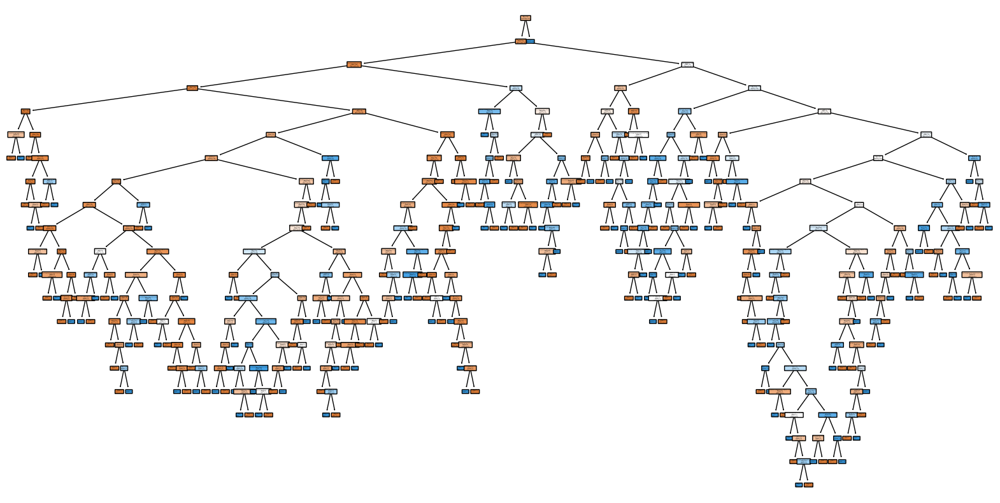


Feature Importance (based on Gini Impurity):
Age                                  0.551222
Churn Score                          0.123395
Satisfaction Score_2                 0.032345
Monthly Charge                       0.030954
Avg Monthly Long Distance Charges    0.030048
City                                 0.022922
Zip Code                             0.020450
CLTV                                 0.020215
Tenure in Months                     0.019340
Total Long Distance Charges          0.019001
Total Revenue                        0.017845
Total Charges                        0.015162
Satisfaction Score_5                 0.013921
Tech Support_No internet service     0.005667
Satisfaction Score_3                 0.005559
Satisfaction Score_4                 0.005375
Internet Type_Fiber Optic            0.005236
Married_Yes                          0.005138
Offer_Offer E                        0.004747
Unlimited Data_Yes                   0.004742
Total Extra Data Charges          

In [15]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import numpy as np

# Step 1: Load your dataset (assuming total_df is already available)
remaining_features = total_df.drop(columns=['Churn Value'])  # Features (excluding the target column)
target = total_df['Churn Value']  # Target column (Churn Value)

# Step 2: Split the data into Train + Test (80%) and Validation (20%)
X_train_test, X_validate, y_train_test, y_validate = train_test_split(remaining_features, target, test_size=0.2, random_state=42)

# Step 3: Split the Train+Test data into Train (70%) and Test (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_test, y_train_test, test_size=0.3, random_state=42)

# Step 4: Preprocessing continuous features (Scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform training data
X_test_scaled = scaler.transform(X_test)  # Only transform test data
X_validate_scaled = scaler.transform(X_validate)  # Only transform validation data

# Step 5: Train a Decision Tree Classifier with Gini Impurity
dt = DecisionTreeClassifier(criterion='gini', random_state=42)
dt.fit(X_train_scaled, y_train)

# Step 6: Evaluate the model on Test data with custom threshold
threshold = 0.8  # Set your desired threshold (e.g., 0.6)

# Predictions with probabilities
y_pred_test_proba = dt.predict_proba(X_test_scaled)[:, 1]  # Get probabilities for class 1 (Churn)
y_pred_test_threshold = np.where(y_pred_test_proba >= threshold, 1, 0)  # Apply the threshold

# Step 7: Calculate performance metrics on Test data
accuracy_test = accuracy_score(y_test, y_pred_test_threshold)
print(f"Test Accuracy (Threshold = {threshold}): {accuracy_test:.4f}")

conf_matrix_test = confusion_matrix(y_test, y_pred_test_threshold)
print("Confusion Matrix (Test Data):")
print(conf_matrix_test)

class_report_test = classification_report(y_test, y_pred_test_threshold)
print("Classification Report (Test Data):")
print(class_report_test)

# Step 8: Evaluate the model on Validation data with custom threshold
y_pred_validate_proba = dt.predict_proba(X_validate_scaled)[:, 1]  # Get probabilities for class 1 (Churn)
y_pred_validate_threshold = np.where(y_pred_validate_proba >= threshold, 1, 0)  # Apply the threshold

accuracy_validate = accuracy_score(y_validate, y_pred_validate_threshold)
print(f"\nValidation Accuracy (Threshold = {threshold}): {accuracy_validate:.4f}")

conf_matrix_validate = confusion_matrix(y_validate, y_pred_validate_threshold)
print("Confusion Matrix (Validation Data):")
print(conf_matrix_validate)

class_report_validate = classification_report(y_validate, y_pred_validate_threshold)
print("Classification Report (Validation Data):")
print(class_report_validate)

# Step 9: Visualize the Decision Tree
plt.figure(figsize=(20, 10))  # Adjust the size of the tree plot
plot_tree(dt, filled=True, feature_names=X_train.columns, class_names=['Not Churn', 'Churn'], rounded=True)
plt.show()

# Step 10: Feature Importance
feature_importance = pd.Series(dt.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nFeature Importance (based on Gini Impurity):")
print(feature_importance)

# plot graph of threshold results

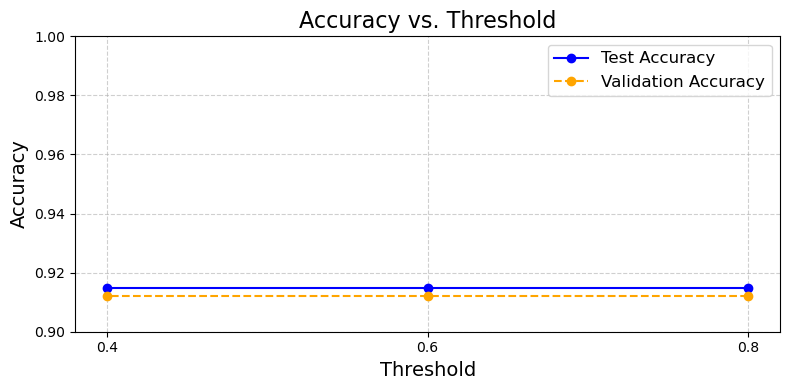

In [16]:
import matplotlib.pyplot as plt

# Thresholds and accuracies (from your results)
thresholds = [0.8, 0.6, 0.4]
test_accuracies = [0.9148, 0.9148, 0.9148]  # Test accuracy values
validation_accuracies = [0.9120, 0.9120, 0.9120]  # Validation accuracy values

# Plot the accuracies
plt.figure(figsize=(8, 4))
plt.plot(thresholds, test_accuracies, label='Test Accuracy', marker='o', linestyle='-', color='blue')
plt.plot(thresholds, validation_accuracies, label='Validation Accuracy', marker='o', linestyle='--', color='orange')

# Add titles and labels
plt.title('Accuracy vs. Threshold', fontsize=16)
plt.xlabel('Threshold', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(thresholds)
plt.ylim(0.9, 1.0)  # Adjust the y-axis range for better visibility
plt.grid(True, linestyle='--', alpha=0.6)

# Add legend
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

In [39]:
import time

# Get the current time in seconds since the epoch
current_time_seconds = time.time()

# Convert the seconds into a structured time (local time)
local_time = time.localtime(current_time_seconds)

# Convert the structured time to a human-readable format
human_readable_time = time.strftime("%Y-%m-%d %H:%M:%S", local_time)

print(f"Current Time: {human_readable_time}")

Current Time: 2024-11-17 14:55:33


In [17]:
# Step 10: Visualize the Decision Tree
plt.figure(figsize=(80, 40), dpi=300)
plot_tree(dt, filled=True, feature_names=X_train.columns, class_names=['Not Churn', 'Churn'], rounded=True, fontsize=10)
plt.savefig('decision_tree_visualization.png', bbox_inches='tight')

# Feature importance using decision tree

                              Feature  Importance
8                                 Age    0.554398
11                       Churn Reason    0.233568
9                                CLTV    0.026866
2                      Monthly Charge    0.023474
13                           Zip Code    0.018406
12                               City    0.018018
4                       Total Charges    0.012762
10                        Churn Score    0.011630
6         Total Long Distance Charges    0.011403
1   Avg Monthly Long Distance Charges    0.010476
7                       Total Revenue    0.009508
0                    Tenure in Months    0.007080
3            Total Extra Data Charges    0.005702
22                Streaming Music_Yes    0.004239
41        Payment Method_Mailed Check    0.003826
34                      Offer_Offer E    0.003677
27                     Dependents_Yes    0.003642
5                       Total Refunds    0.003293
19         Device Protection Plan_Yes    0.003102


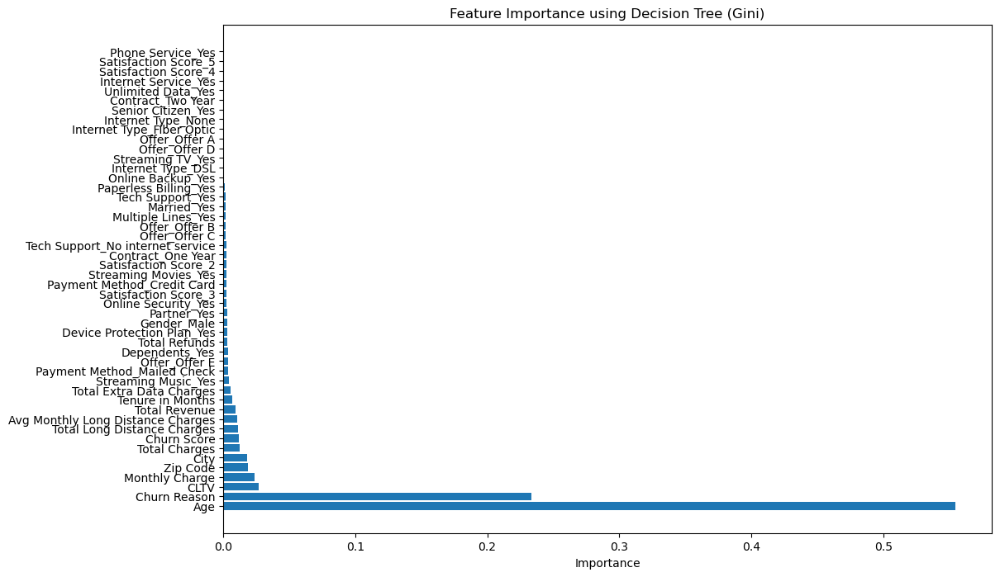

In [11]:
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'total_df' is your DataFrame and the target is 'Churn Value'

# Define the feature columns (excluding the target column 'Churn Value')
X = total_df.drop('Churn Value', axis=1)  # Features
y = total_df['Churn Value']               # Target variable

# Initialize and fit the Decision Tree Classifier using Gini impurity
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_classifier.fit(X, y)

# Get the feature importance values
feature_importance = dt_classifier.feature_importances_

# Create a DataFrame to view feature names and their corresponding importance
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importance
})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importance
print(feature_importance_df)

# Plotting the feature importance
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Feature Importance using Decision Tree (Gini)')
plt.show()

Cross-Validation Accuracy (5 folds): [0.91888466 0.91001267 0.91001267 0.9035533  0.92005076]
Mean Cross-Validation Accuracy: 0.9125
Standard Deviation of Cross-Validation Accuracy: 0.0062
Test Accuracy: 0.9148
Confusion Matrix (Test Data):
[[1193   77]
 [  67  354]]
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      1270
           1       0.82      0.84      0.83       421

    accuracy                           0.91      1691
   macro avg       0.88      0.89      0.89      1691
weighted avg       0.92      0.91      0.92      1691


Validation Accuracy: 0.9120
Confusion Matrix (Validation Data):
[[952  57]
 [ 67 333]]
Classification Report (Validation Data):
              precision    recall  f1-score   support

           0       0.93      0.94      0.94      1009
           1       0.85      0.83      0.84       400

    accuracy                           0.91      1409
   macro avg       0.89

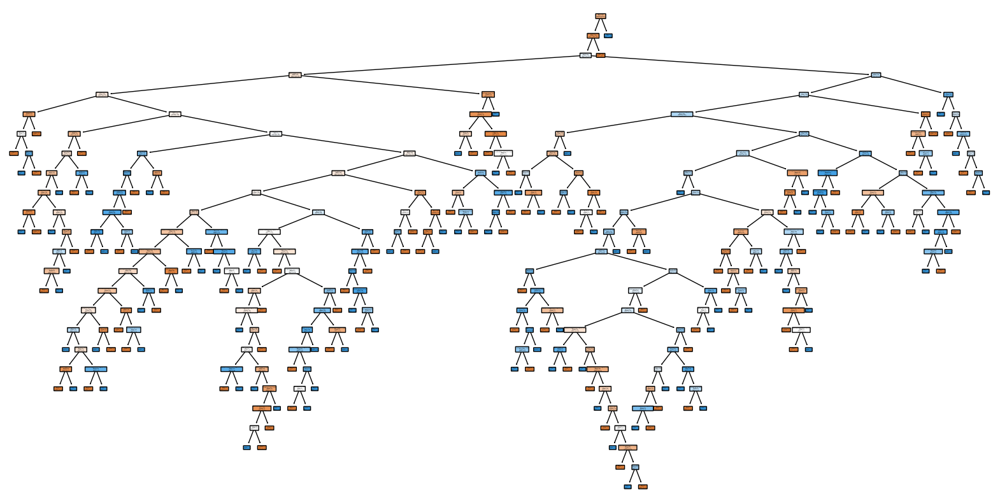


Feature Importance (based on Gini Impurity):
Age                                  0.557211
Churn Reason                         0.237069
Avg Monthly Long Distance Charges    0.028432
CLTV                                 0.023025
Zip Code                             0.022180
Monthly Charge                       0.021083
Total Revenue                        0.014671
Churn Score                          0.013745
City                                 0.011860
Total Charges                        0.011758
Total Long Distance Charges          0.008934
Dependents_Yes                       0.007413
Total Extra Data Charges             0.004686
Internet Type_DSL                    0.003599
Tenure in Months                     0.003539
Payment Method_Mailed Check          0.002941
Satisfaction Score_2                 0.002918
Married_Yes                          0.002451
Streaming Music_Yes                  0.002400
Offer_Offer C                        0.002378
Contract_One Year                 

In [12]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Step 1: Load your dataset (assuming total_df is already available)
remaining_features = total_df.drop(columns=['Churn Value'])  # Features (excluding the target column)
target = total_df['Churn Value']  # Target column (Churn Value)

# Step 2: Split the data into Train + Test (80%) and Validation (20%)
X_train_test, X_validate, y_train_test, y_validate = train_test_split(remaining_features, target, test_size=0.2, random_state=42)

# Step 3: Split the Train+Test data into Train (70%) and Test (30%)
X_train, X_test, y_train, y_test = train_test_split(X_train_test, y_train_test, test_size=0.3, random_state=42)

# Step 4: Preprocessing continuous features (Scaling)
# If you have continuous variables, it's generally a good idea to scale them
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform training data
X_test_scaled = scaler.transform(X_test)  # Only transform test data
X_validate_scaled = scaler.transform(X_validate)  # Only transform validation data

# Step 5: Train a Decision Tree Classifier with Gini Impurity
dt = DecisionTreeClassifier(criterion='gini', random_state=42)

# Step 6: Cross-validation on the training set
cv_scores = cross_val_score(dt, X_train_scaled, y_train, cv=5, scoring='accuracy')  # 5-fold cross-validation
print(f"Cross-Validation Accuracy (5 folds): {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {cv_scores.mean():.4f}")
print(f"Standard Deviation of Cross-Validation Accuracy: {cv_scores.std():.4f}")

# Step 7: Train the model on the full training set
dt.fit(X_train_scaled, y_train)

# Step 8: Evaluate the model on Test data
# Predictions on the test set
y_pred_test = dt.predict(X_test_scaled)

# Step 9: Calculate performance metrics on Test data
# Accuracy on Test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test Accuracy: {accuracy_test:.4f}")

# Confusion Matrix on Test set
conf_matrix_test = confusion_matrix(y_test, y_pred_test)
print("Confusion Matrix (Test Data):")
print(conf_matrix_test)

# Classification Report on Test set
class_report_test = classification_report(y_test, y_pred_test)
print("Classification Report (Test Data):")
print(class_report_test)

# Step 10: Evaluate the model on Validation data
# Predictions on the validation set
y_pred_validate = dt.predict(X_validate_scaled)

# Step 11: Calculate performance metrics on Validation data
# Accuracy on Validation set
accuracy_validate = accuracy_score(y_validate, y_pred_validate)
print(f"\nValidation Accuracy: {accuracy_validate:.4f}")

# Confusion Matrix on Validation set
conf_matrix_validate = confusion_matrix(y_validate, y_pred_validate)
print("Confusion Matrix (Validation Data):")
print(conf_matrix_validate)

# Classification Report on Validation set
class_report_validate = classification_report(y_validate, y_pred_validate)
print("Classification Report (Validation Data):")
print(class_report_validate)

# Step 12: Visualize the Decision Tree
plt.figure(figsize=(20, 10))  # Adjust the size of the tree plot
plot_tree(dt, filled=True, feature_names=X_train.columns, class_names=['Not Churn', 'Churn'], rounded=True)
plt.show()

# Step 13: Feature Importance (to understand which features are important for predicting Churn)
feature_importance = pd.Series(dt.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nFeature Importance (based on Gini Impurity):")
print(feature_importance)

# Random forest and gradient boosting

In [14]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score

# Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
# Gradient Boosting Classifier
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Train and Evaluate Random Forest
rf.fit(X_train_scaled, y_train)
y_pred_rf_test = rf.predict(X_test_scaled)
y_pred_rf_validate = rf.predict(X_validate_scaled)

# Train and Evaluate Gradient Boosting
gb.fit(X_train_scaled, y_train)
y_pred_gb_test = gb.predict(X_test_scaled)
y_pred_gb_validate = gb.predict(X_validate_scaled)

# Random Forest Results
print("Random Forest Results:")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_rf_test):.4f}")
print(f"Validation Accuracy: {accuracy_score(y_validate, y_pred_rf_validate):.4f}")
print("Confusion Matrix (Test Data):")
print(confusion_matrix(y_test, y_pred_rf_test))
print("Classification Report (Test Data):")
print(classification_report(y_test, y_pred_rf_test))

# Gradient Boosting Results
print("Gradient Boosting Results:")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_gb_test):.4f}")
print(f"Validation Accuracy: {accuracy_score(y_validate, y_pred_gb_validate):.4f}")
print("Confusion Matrix (Test Data):")
print(confusion_matrix(y_test, y_pred_gb_test))
print("Classification Report (Test Data):")
print(classification_report(y_test, y_pred_gb_test))

# Feature Importances for Random Forest
importances_rf = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nRandom Forest Feature Importances:")
print(importances_rf)

# Feature Importances for Gradient Boosting
importances_gb = pd.Series(gb.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nGradient Boosting Feature Importances:")
print(importances_gb)

Random Forest Results:
Test Accuracy: 0.9154
Validation Accuracy: 0.9099
Confusion Matrix (Test Data):
[[1199   71]
 [  72  349]]
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1270
           1       0.83      0.83      0.83       421

    accuracy                           0.92      1691
   macro avg       0.89      0.89      0.89      1691
weighted avg       0.92      0.92      0.92      1691

Gradient Boosting Results:
Test Accuracy: 0.9178
Validation Accuracy: 0.9269
Confusion Matrix (Test Data):
[[1186   84]
 [  55  366]]
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1270
           1       0.81      0.87      0.84       421

    accuracy                           0.92      1691
   macro avg       0.88      0.90      0.89      1691
weighted avg       0.92      0.92      0.92      1691


Random Fore

# Forward selection

In [27]:
# Start with an empty set of features
selected_features = []
remaining_features = list(X.columns)
best_score = 0

# Start forward selection process
while len(remaining_features) > 0:
    scores = {}
    
    # Train and evaluate by adding one feature at a time
    for feature in remaining_features:
        temp_features = selected_features + [feature]
        dt = DecisionTreeClassifier(random_state=42)
        dt.fit(X[temp_features], y)
        y_pred = dt.predict(X[temp_features])
        score = accuracy_score(y, y_pred)
        scores[feature] = score
    
    # Find the feature whose addition gives the best improvement
    best_feature = max(scores, key=scores.get)
    
    # If adding this feature improves the model, add it
    if scores[best_feature] > best_score:
        best_score = scores[best_feature]
        selected_features.append(best_feature)
        remaining_features.remove(best_feature)
    else:
        # Stop if no further improvement
        break

# Output the selected features
print("Selected Features after Forward Selection:", selected_features)

Selected Features after Forward Selection: ['Total Revenue', 'Age']


# Feature importance after backward elimination

# Using Gini

In [16]:
# Step 1: Import Libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import classification_report, accuracy_score

# Step 2: Separate Features and Target
# Assume 'total_df' is your prepared dataframe
# Features (X) are all columns except the target variable
# Target (y) is the column you want to predict
X = total_df.drop('Churn Value', axis=1)  # Replace 'target' with your actual target column name
y = total_df['target']

# Step 3: Split Data into Train+Validation and Test Sets
# Split data into two parts:
# - 80% for training and validation (X_train_val, y_train_val)
# - 20% for testing (X_test, y_test)
# The 'stratify' parameter ensures that the class distribution is preserved in each split
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Step 4: Further Split Train+Validation into Train and Validation Sets
# From the 80% training data, split again:
# - 60% for training (X_train, y_train)
# - 20% for validation (X_val, y_val)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.25, random_state=42, stratify=y_train_val
)

# Print the sizes of each split to verify
print(f"Training Set: {X_train.shape}")  # 60% of the total data
print(f"Validation Set: {X_val.shape}")  # 20% of the total data
print(f"Test Set: {X_test.shape}")       # 20% of the total data

# Step 5: Train Decision Tree Classifier
# Initialize the Decision Tree Classifier
# Criterion 'gini' means the Gini index will be used to measure split quality
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)

# Train the classifier on the training set
dt_classifier.fit(X_train, y_train)

# Step 6: Validate the Model
# Use the validation set to evaluate model performance during intermediate tuning
y_val_pred = dt_classifier.predict(X_val)  # Predict on the validation set

# Print classification metrics for the validation set
print("\nValidation Set Performance:")
print(classification_report(y_val, y_val_pred))  # Includes precision, recall, and F1-score
print("Validation Accuracy:", accuracy_score(y_val, y_val_pred))  # Overall accuracy

# Step 7: Test the Model
# After validating and finalizing the model, test it on the unseen test set
y_test_pred = dt_classifier.predict(X_test)  # Predict on the test set

# Print classification metrics for the test set
print("\nTest Set Performance:")
print(classification_report(y_test, y_test_pred))  # Includes precision, recall, and F1-score
print("Test Accuracy:", accuracy_score(y_test, y_test_pred))  # Overall accuracy

# Step 8: Visualize the Decision Tree Structure (Optional)
# Use export_text to visualize the tree splits and understand how Gini values are used
tree_rules = export_text(dt_classifier, feature_names=list(X.columns))
print("\nDecision Tree Structure:\n", tree_rules)

KeyError: "['target'] not found in axis"